## Configuración inicial

A continuación se importan las librerías necesarias para el funcionamiento del notebook.

In [2]:
#plots and data
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

#metrics and transformations
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn import metrics

#Model 
from sklearn.neural_network import MLPRegressor
sns.set()

In [3]:
def plot_predict_test(df_test_y,testPredict,lag):
        ### Resultado predicción datos de entrenamiento
    print(testPredict.flatten())
    fig, ax = plt.subplots(figsize=[15,8])
    sns.lineplot(df_test_y.flatten(),label="real")
    sns.lineplot(testPredict.flatten(),label="predicción")
    plt.title("Comparación valor real y predicción")
    plt.ylabel("value")

In [4]:
def createLagFeature(name_features,lag,df):
    for name_feature in name_features:
        for i in range(1,lag+1):
            df[name_feature+"lag"+str(i)]=df[name_feature].shift(i)
    return df

In [5]:
#function to measure the performance
def timeseries_evaluation_metrics_func(y_true, y_pred,flag):
    def mean_absolute_percentage_error(y_true, y_pred): 
        epsilon=0.1e-5
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    if flag : print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')
    else:
        print('Evaluation metric results:')
        print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
        print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
        print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
        print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}')
        
    return {"MSE":metrics.mean_squared_error(y_true, y_pred),
           "MAE":metrics.mean_absolute_error(y_true, y_pred),
           "RMSE":np.sqrt(metrics.mean_squared_error(y_true, y_pred)),
           "MAPE":mean_absolute_percentage_error(y_true, y_pred)}

---

## Cargar y preparar los datos.

In [6]:
df = pd.read_csv("../../Datasets/Datos_antes_pandemia/data_antes_vol_in.csv")

df['Fecha'] = pd.to_datetime(df['Fecha'])
df = df.sort_values('Fecha', ascending=True)
df = df.rename(columns = {'Vol. Futuros': 'VolFuturos'})
df

,Fecha,VolFuturos,VIX,EMV-ID,EPU
0,2010-01-01,0.000000,22.543626,2.01,174.55
1,2010-01-02,4.256365,22.171185,0.00,119.52
2,2010-01-03,0.794545,21.143152,1.15,216.95
3,2010-01-04,0.787899,20.040000,1.22,150.35
4,2010-01-05,0.601027,19.350000,0.95,151.16
...,...,...,...,...,...
3648,2019-12-27,4.003614,13.430000,0.00,127.92
3649,2019-12-28,2.090121,14.351756,0.00,123.10
3650,2019-12-29,0.539108,14.946538,4.26,245.14
3651,2019-12-30,1.815513,14.820000,0.97,101.31


---

## Desarrollo del modelo ELM

In [7]:
#objects to scale the data 
sc=StandardScaler()
sc2=StandardScaler()

In [8]:
df_stats=df

In [9]:
#
len_data=df_stats.shape[0]

#get target
df_label=df_stats["VolFuturos"].values.reshape(len_data,1)
#get attributes
df_data=df_stats.drop(columns=["Fecha"])

#apply scale
#df_label=sc.fit_transform(df_label)
#df_data_normalize=sc2.fit_transform(df_data)


In [10]:
def Model(df_data,df_label,lag,estimators):
    
    delete_columns=list(df_data.columns)
    df_data_lags=createLagFeature(df_data.columns,lag,df_data) if lag>0 else df_data
    
    df_data_lags.drop(columns=delete_columns,inplace=True)
    df_data_lags=df_data_lags[lag:]
    df_label=df_label[lag:]

    #transform data
    df_data_lags=sc2.fit_transform(df_data_lags)
    
    #split data
    #last index of the train data
    seventy_percent=int(len_data*0.7)

    #split the data normalize
    
    df_train=df_data_lags[:seventy_percent]
    df_test=df_data_lags[seventy_percent:]

    #split labels
    
    df_train_y=df_label[:seventy_percent]
    df_test_y=df_label[seventy_percent:]
    #split labels normalize
    
    df_label_normalize=sc.fit_transform(df_label)
    df_train_y_normalize=df_label_normalize[:seventy_percent]
    df_test_y_normalize=df_label_normalize[seventy_percent:]
    


    #make model
    model=MLPRegressor(hidden_layer_sizes=(estimators,), activation='logistic', solver='adam')
    #fit the model with the train data
    history=model.fit(df_train,df_train_y_normalize)
   
    # make predictions
    trainPredict = model.predict(df_train)
    trainPredict = np.reshape(trainPredict,(len(trainPredict),1))
    # invert transformation
    trainPredict = sc.inverse_transform(trainPredict)
    
    trainY = df_train_y
    
    # make predictions
    testPredict = model.predict(df_test)
    # invert transformation
    testPredict = np.reshape(testPredict,(len(testPredict),1))
    testPredict = sc.inverse_transform(testPredict)
    testY = df_test_y
    print("len test: ",testY.shape)
    print("len PREDICT: ",testPredict.shape)

    plot_predict_test(df_train_y,trainPredict,lag)
    plot_predict_test(df_test_y,testPredict,lag)
    return [{"Fecha":df_stats.Fecha[lag:][:seventy_percent],"typeELM":["train"]*len(trainPredict.flatten()),"ELM" :trainPredict.flatten()}
            ,{"Fecha":df_stats.Fecha[lag:][seventy_percent:],"typeELM":["test"]*len(testPredict.flatten()),"ELM":testPredict.flatten()}]
    
    return {"train":timeseries_evaluation_metrics_func(trainY.flatten()+1, trainPredict.flatten()+1,False),
           "test":timeseries_evaluation_metrics_func(testY.flatten()+1, testPredict.flatten()+1,False)}

## Resultados

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.26757043 1.19319358 1.25668477 ... 0.92024374 1.04705328 1.13799417]
[1.49480862 1.75253859 1.35425233 ... 1.6752373  0.78236715 1.62076997]
Evaluation metric results:
MSE is : 1.3254908618860668
MAE is : 0.8368935331868245
RMSE is : 1.1512996403569606
MAPE is : 41.28753054769148
Evaluation metric results:
MSE is : 0.9663594142278037
MAE is : 0.7569669610457042
RMSE is : 0.9830358153331972
MAPE is : 41.678869991101564


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.19111524 1.19381346 1.22354213 ... 0.90792875 1.03581837 1.1011161 ]
[1.50263438 1.76482383 1.31830328 ... 1.64522079 0.79133324 1.68796642]
Evaluation metric results:
MSE is : 1.3220849166120237
MAE is : 0.8337113731618733
RMSE is : 1.149819514798746
MAPE is : 40.884393733163044
Evaluation metric results:
MSE is : 0.9601549191620057
MAE is : 0.7513715075646703
RMSE is : 0.979874950777907
MAPE is : 41.12277871211988


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.19208393 1.21013762 1.22756746 ... 0.92864891 1.05914977 1.11013596]
[1.50792982 1.77137185 1.32443496 ... 1.6478394  0.81688554 1.66922174]
Evaluation metric results:
MSE is : 1.3232468199201464
MAE is : 0.8369451037416049
RMSE is : 1.1503246584856583
MAPE is : 41.253010616522104
Evaluation metric results:
MSE is : 0.9623084941327271
MAE is : 0.7545070140705511
RMSE is : 0.9809732382347274
MAPE is : 41.50515451904474


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.1888554  1.21230133 1.22730926 ... 0.94060406 1.05505952 1.112662  ]
[1.52449034 1.77220941 1.32332462 ... 1.6461075  0.84053814 1.66964261]
Evaluation metric results:
MSE is : 1.3221432760801677
MAE is : 0.8372919477688584
RMSE is : 1.1498448921833622
MAPE is : 41.31339519251596
Evaluation metric results:
MSE is : 0.9621116705491539
MAE is : 0.7547960924633755
RMSE is : 0.9808729125371716
MAPE is : 41.55158425438596


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.18121005 1.22705849 1.23374338 ... 0.94150319 1.06067193 1.10157241]
[1.52460989 1.77932329 1.32276938 ... 1.6336462  0.84005485 1.68590231]
Evaluation metric results:
MSE is : 1.323313698372998
MAE is : 0.8394849306979334
RMSE is : 1.1503537274999365
MAPE is : 41.57127298179967
Evaluation metric results:
MSE is : 0.9639848645553392
MAE is : 0.7571812942374645
RMSE is : 0.9818273089272569
MAPE is : 41.811578465794966


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.19781631 1.23817896 1.24417456 ... 0.94672353 1.06977116 1.12642703]
[1.530583   1.78096724 1.32264401 ... 1.63290619 0.83698429 1.67622227]
Evaluation metric results:
MSE is : 1.3231949070978384
MAE is : 0.839845107759264
RMSE is : 1.1503020938422386
MAPE is : 41.597118097342154
Evaluation metric results:
MSE is : 0.9627183701780173
MAE is : 0.7562302944323681
RMSE is : 0.9811821289536501
MAPE is : 41.717840037226786


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.18675054 1.22537016 1.23683293 ... 0.95661461 1.06505879 1.10452937]
[1.52953133 1.77848369 1.31720716 ... 1.62678275 0.85365602 1.6855003 ]
Evaluation metric results:
MSE is : 1.3233107142996978
MAE is : 0.8394140830677079
RMSE is : 1.1503524304749817
MAPE is : 41.54788427316215
Evaluation metric results:
MSE is : 0.9641170592835987
MAE is : 0.7577256370940797
RMSE is : 0.9818946273829992
MAPE is : 41.85943709028848


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.19344781 1.24961089 1.24925154 ... 0.96230224 1.08095035 1.12249742]
[1.53484799 1.7913132  1.34326781 ... 1.65260186 0.85572277 1.71206312]
Evaluation metric results:
MSE is : 1.3235295533336915
MAE is : 0.843104798744268
RMSE is : 1.1504475447988454
MAPE is : 41.991714580489415
Evaluation metric results:
MSE is : 0.968988456204768
MAE is : 0.7622339644211847
RMSE is : 0.9843721126712033
MAPE is : 42.32736251158042


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.16921843 1.22900016 1.22619991 ... 0.95362156 1.06808031 1.1013013 ]
[1.52259796 1.77611252 1.32090948 ... 1.62051089 0.83858224 1.67355356]
Evaluation metric results:
MSE is : 1.323414856903398
MAE is : 0.8394553840812764
RMSE is : 1.150397695105218
MAPE is : 41.54215618607534
Evaluation metric results:
MSE is : 0.9638927192780335
MAE is : 0.7576393539384587
RMSE is : 0.9817803824063881
MAPE is : 41.85618920381984


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.0991053  1.15104826 1.15390882 ... 0.90355385 0.99518451 1.03013933]
[1.46092264 1.70713185 1.25487116 ... 1.54969169 0.78705261 1.59239633]
Evaluation metric results:
MSE is : 1.3271522437421184
MAE is : 0.8263632655832499
RMSE is : 1.1520209389338887
MAPE is : 39.77156185215685
Evaluation metric results:
MSE is : 0.9492250554995295
MAE is : 0.7398022249830639
RMSE is : 0.9742818152359868
MAPE is : 39.867601026116844


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.07351464 1.1553617  1.14374402 ... 0.90327298 0.99478315 1.0148213 ]
[1.4496499  1.69947131 1.24470848 ... 1.52534542 0.77578429 1.57693791]


<ipython-input-3-72e029a2b199>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=[15,8])


Evaluation metric results:
MSE is : 1.3276813731792114
MAE is : 0.8269904944283519
RMSE is : 1.152250568747619
MAPE is : 39.84082462170554
Evaluation metric results:
MSE is : 0.9483856269410088
MAE is : 0.7396101497280666
RMSE is : 0.9738509264466553
MAPE is : 39.87204131479676


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.0456299  1.11730429 1.12226475 ... 0.89210942 0.97419066 1.00038893]
[1.43775743 1.67918371 1.22547061 ... 1.50440352 0.74525636 1.54071404]
Evaluation metric results:
MSE is : 1.3304898286938367
MAE is : 0.8239830248850072
RMSE is : 1.1534686075892298
MAPE is : 39.383847200986175
Evaluation metric results:
MSE is : 0.9475423259493716
MAE is : 0.7374030456465299
RMSE is : 0.9734178578336087
MAPE is : 39.578967197443085


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[0.88263414 1.0004531  0.95452078 ... 0.77632291 0.82830382 0.87055734]
[1.31310991 1.52925576 1.11742653 ... 1.37359961 0.5907841  1.34577982]
Evaluation metric results:
MSE is : 1.3670356778617219
MAE is : 0.8080924232922838
RMSE is : 1.1692030096872492
MAPE is : 36.328419692031936
Evaluation metric results:
MSE is : 0.9459964096965667
MAE is : 0.7112036193681455
RMSE is : 0.9726234675847415
MAPE is : 36.03849413698267


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.27991178 1.36036882 0.97090339 ... 1.07227879 1.5849352  1.79534882]
[1.18647626 1.05120061 1.07787183 ... 1.69965027 0.8711598  1.77487374]
Evaluation metric results:
MSE is : 1.2944580924482756
MAE is : 0.8268389779365151
RMSE is : 1.1377425422512228
MAPE is : 40.679827031586534
Evaluation metric results:
MSE is : 0.9717955158708159
MAE is : 0.7567636878169897
RMSE is : 0.9857968938228685
MAPE is : 41.55485660629241


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.28889087 1.34714254 1.00285806 ... 1.0832809  1.54852375 1.85522267]
[1.24438456 1.09328212 1.10871658 ... 1.70147879 0.79228087 1.64885778]
Evaluation metric results:
MSE is : 1.287096406241282
MAE is : 0.8287150833785751
RMSE is : 1.134502713192561
MAPE is : 41.04737094436943
Evaluation metric results:
MSE is : 0.9734424162282603
MAE is : 0.7603541288822273
RMSE is : 0.986631854456494
MAPE is : 41.91796293517381


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.22638758 1.38843689 0.97661742 ... 1.09543553 1.58925182 1.89935844]
[1.25330709 1.10687471 1.11462442 ... 1.77016398 0.88425123 1.76776376]
Evaluation metric results:
MSE is : 1.2870163088705835
MAE is : 0.8260801524900242
RMSE is : 1.1344674119914522
MAPE is : 40.71087142439401
Evaluation metric results:
MSE is : 0.9789280470400749
MAE is : 0.7598901173694388
RMSE is : 0.9894079275203301
MAPE is : 41.82222707392023


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.2565832  1.38821788 0.99650101 ... 1.12448002 1.58593367 1.86439573]
[1.24738159 1.11678622 1.12466876 ... 1.73991283 0.84440138 1.72313669]
Evaluation metric results:
MSE is : 1.2889621489285137
MAE is : 0.8292320400047379
RMSE is : 1.1353246887690382
MAPE is : 41.048088432816655
Evaluation metric results:
MSE is : 0.9833727515206693
MAE is : 0.7648536142686138
RMSE is : 0.9916515272618044
MAPE is : 42.235482340865325


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.18518409 1.31613474 0.92749229 ... 1.0577832  1.57849218 1.86567587]
[1.23094208 1.03415058 1.07871408 ... 1.68495002 0.74277288 1.80410574]
Evaluation metric results:
MSE is : 1.2849064869017008
MAE is : 0.8205559100885237
RMSE is : 1.1335371572655661
MAPE is : 40.06185310464537
Evaluation metric results:
MSE is : 0.9747796428793928
MAE is : 0.7551770918050261
RMSE is : 0.9873092944358383
MAPE is : 41.19926675593765


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.30096389 1.40587998 0.99161069 ... 1.11052662 1.57945594 1.87792956]
[1.27098545 1.12693355 1.12094804 ... 1.75151962 0.84945758 1.77808673]
Evaluation metric results:
MSE is : 1.287651481185913
MAE is : 0.8273509200186385
RMSE is : 1.1347473204136298
MAPE is : 40.852902795328816
Evaluation metric results:
MSE is : 0.981434130052192
MAE is : 0.7626635316004436
RMSE is : 0.9906735739143303
MAPE is : 41.99375711428024


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.24164707 1.34890594 0.97316089 ... 1.11140991 1.55724512 1.89948065]
[1.28878872 1.09513412 1.10568069 ... 1.75826094 0.83775601 1.80470984]
Evaluation metric results:
MSE is : 1.281096150411655
MAE is : 0.8247946411220657
RMSE is : 1.131855180847645
MAPE is : 40.763401691730884
Evaluation metric results:
MSE is : 0.9814202205038162
MAE is : 0.7635284485384404
RMSE is : 0.9906665536414441
MAPE is : 42.1077723415136


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.21178238 1.28899543 0.95719686 ... 1.04966205 1.49654939 1.74309522]
[1.13794483 1.04008327 1.09998844 ... 1.62227754 0.8235107  1.69125673]
Evaluation metric results:
MSE is : 1.3151444247534425
MAE is : 0.825924009778747
RMSE is : 1.1467974645740382
MAPE is : 39.934449337979814
Evaluation metric results:
MSE is : 0.956914828792178
MAE is : 0.7415797037759714
RMSE is : 0.9782202353213606
MAPE is : 40.0295856752828


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.26370551 1.38863234 0.98565722 ... 1.08649387 1.56109569 1.84636219]
[1.25468055 1.09470474 1.07826854 ... 1.76563397 0.77737431 1.69297619]
Evaluation metric results:
MSE is : 1.28469534957931
MAE is : 0.8248714114280152
RMSE is : 1.1334440213699617
MAPE is : 40.63119633781338
Evaluation metric results:
MSE is : 0.9797639610367472
MAE is : 0.7612695629111704
RMSE is : 0.9898302688020544
MAPE is : 41.823549342233555


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.17907047 1.25378855 0.9404321  ... 1.03036762 1.47939933 1.71544557]
[1.13139705 1.0473912  1.1241534  ... 1.58819612 0.81279013 1.66456746]
Evaluation metric results:
MSE is : 1.3237565074347388
MAE is : 0.8263306882097308
RMSE is : 1.1505461778802009
MAPE is : 39.74951338118192
Evaluation metric results:
MSE is : 0.9544383893260023
MAE is : 0.7405161179142205
RMSE is : 0.9769536270089806
MAPE is : 39.9595533468719


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.15500953 1.22695016 0.91738207 ... 0.98773002 1.44289431 1.66720008]
[1.08052851 1.00450819 1.07557442 ... 1.54160507 0.75613613 1.58539712]
Evaluation metric results:
MSE is : 1.3296693751552182
MAE is : 0.8206716321090111
RMSE is : 1.1531129065079526
MAPE is : 38.843287595089606
Evaluation metric results:
MSE is : 0.9470444165622853
MAE is : 0.7277065920290443
RMSE is : 0.9731620710664207
MAPE is : 38.46215714641441


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.14054773 1.21013348 0.89033277 ... 1.00561345 1.44122887 1.65445456]
[1.08363702 1.00261168 1.07898947 ... 1.52665317 0.77813075 1.55702589]
Evaluation metric results:
MSE is : 1.3314006368840032
MAE is : 0.8197447898113907
RMSE is : 1.1538633527779636
MAPE is : 38.693588717733824
Evaluation metric results:
MSE is : 0.945792532391494
MAE is : 0.7251009468019254
RMSE is : 0.9725186540069521
MAPE is : 38.147014021743395


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.4866419  1.50638376 1.23431297 ... 1.38453299 1.8258336  2.02112736]
[1.45925371 1.44015911 1.5170481  ... 1.90361311 1.21745071 1.96932786]
Evaluation metric results:
MSE is : 1.3979378348523457
MAE is : 0.9242756603674921
RMSE is : 1.182344211662723
MAPE is : 50.05662864894461
Evaluation metric results:
MSE is : 1.134803069122545
MAE is : 0.8780256772842818
RMSE is : 1.0652713593833945
MAPE is : 52.65245909749403


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.94537683 1.26096617 0.71604204 ... 1.92228997 1.26461998 0.72582166]
[0.69373154 0.70284776 1.5460158  ... 1.76168083 0.90233335 1.99677012]
Evaluation metric results:
MSE is : 1.2673700659837253
MAE is : 0.8205817417238149
RMSE is : 1.1257753177182939
MAPE is : 40.59893143226523
Evaluation metric results:
MSE is : 0.954493352564222
MAE is : 0.7472294556365628
RMSE is : 0.9769817565155564
MAPE is : 40.91298963080423


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.99730606 1.28655726 0.72341343 ... 1.96091865 1.31583807 0.79875039]
[0.61471109 0.68203867 1.63192153 ... 1.80405533 1.0431891  1.75312563]
Evaluation metric results:
MSE is : 1.2572592769704154
MAE is : 0.8156315743229495
RMSE is : 1.1212757363692551
MAPE is : 40.189341413924886
Evaluation metric results:
MSE is : 0.9565867398061696
MAE is : 0.7482724197789431
RMSE is : 0.9780525240528597
MAPE is : 40.93135057118065


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[1.0317564  1.30645636 0.73209445 ... 1.94140109 1.25531646 0.78781457]
[0.62753501 0.71618793 1.55627983 ... 1.78802946 1.05071095 1.9987241 ]
Evaluation metric results:
MSE is : 1.2444379695136254
MAE is : 0.8140907527035791
RMSE is : 1.1155437999081996
MAPE is : 40.35599051847046
Evaluation metric results:
MSE is : 0.9573466437221937
MAE is : 0.7491989411616454
RMSE is : 0.9784409250037499
MAPE is : 41.063017277100606


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.90316318 1.22678518 0.65501732 ... 1.88823602 1.24749074 0.72320455]
[0.5729174  0.70613807 1.45613362 ... 1.81494664 0.88085257 1.84780785]
Evaluation metric results:
MSE is : 1.2267142937988764
MAE is : 0.8032167100797526
RMSE is : 1.1075713493039065
MAPE is : 39.49779357399077
Evaluation metric results:
MSE is : 0.9583243656791377
MAE is : 0.7478180706785925
RMSE is : 0.978940430097326
MAPE is : 40.64066761653856


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.90262987 1.20592843 0.7372864  ... 1.9364462  1.22986536 0.7979055 ]
[0.60337183 0.7447749  1.50912153 ... 1.77184088 1.06072888 1.95965598]
Evaluation metric results:
MSE is : 1.2313175118961954
MAE is : 0.8099516257577322
RMSE is : 1.1096474719009617
MAPE is : 40.15307573796455
Evaluation metric results:
MSE is : 0.9660760564927203
MAE is : 0.7552350525783684
RMSE is : 0.9828916809561064
MAPE is : 41.38858070881935


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.9147147  1.1648797  0.63126292 ... 1.8275034  1.16716421 0.69888994]
[0.64459522 0.71611417 1.4659746  ... 1.7380374  0.8552208  1.98336428]
Evaluation metric results:
MSE is : 1.2369595454301043
MAE is : 0.8068715175888297
RMSE is : 1.1121868302718318
MAPE is : 39.551342964418616
Evaluation metric results:
MSE is : 0.9498920733322479
MAE is : 0.7416931566284815
RMSE is : 0.9746240676959748
MAPE is : 40.11869496412568


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.86038107 1.22972868 0.65395351 ... 1.88282247 1.13748295 0.69244897]
[0.64801366 0.69608335 1.49146528 ... 1.7614923  0.95508669 2.03146072]
Evaluation metric results:
MSE is : 1.227892777700539
MAE is : 0.808218774156815
RMSE is : 1.1081032342252861
MAPE is : 40.09570352715717
Evaluation metric results:
MSE is : 0.9611317765771883
MAE is : 0.7535648687438053
RMSE is : 0.9803732843040901
MAPE is : 41.313833213326525


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.98496812 1.21108074 0.70057915 ... 1.92601408 1.23900006 0.8043178 ]
[0.5965887  0.70166154 1.59443441 ... 1.69041493 0.94635481 1.89409136]
Evaluation metric results:
MSE is : 1.229307633116329
MAE is : 0.8088153424496696
RMSE is : 1.1087414636047166
MAPE is : 40.106161930763584
Evaluation metric results:
MSE is : 0.9568736241106465
MAE is : 0.7475846371349653
RMSE is : 0.9781991740492559
MAPE is : 40.74641232577104


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.91946921 1.1538833  0.65135582 ... 1.88299688 1.23665581 0.66435185]
[0.56924568 0.6140912  1.52809602 ... 1.72286365 0.895235   2.02322591]
Evaluation metric results:
MSE is : 1.2343590669492042
MAE is : 0.8060479697362486
RMSE is : 1.1110171317082398
MAPE is : 39.710064608619994
Evaluation metric results:
MSE is : 0.9593869804221544
MAE is : 0.7502154222949969
RMSE is : 0.9794830169135933
MAPE is : 40.89895328312417


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[1.08721546 1.45015527 0.93839263 ... 1.88774871 1.31335295 0.98386114]
[0.98142047 0.95344969 1.61840888 ... 1.76701324 1.06059123 2.02450624]
Evaluation metric results:
MSE is : 1.3103199820229385
MAE is : 0.8545209048621394
RMSE is : 1.1446920904867555
MAPE is : 43.814832929597486
Evaluation metric results:
MSE is : 0.9809718969294488
MAE is : 0.7784964927263703
RMSE is : 0.9904402540938291
MAPE is : 44.243743037834044


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.97139658 1.33991719 0.83835705 ... 1.73204532 1.18484806 0.85985897]
[0.85008165 0.81622401 1.44701623 ... 1.60516283 0.91673106 1.82004633]
Evaluation metric results:
MSE is : 1.3067473516505297
MAE is : 0.8250507947730965
RMSE is : 1.1431305050826566
MAPE is : 40.135391303784736
Evaluation metric results:
MSE is : 0.9338429309551873
MAE is : 0.7313503112547372
RMSE is : 0.9663554889145026
MAPE is : 39.502711593789435


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[1.04554835 1.39115796 0.87818078 ... 1.77035642 1.20650211 0.91130562]
[0.90730568 0.85554036 1.50957686 ... 1.65641568 1.00351204 1.92580765]
Evaluation metric results:
MSE is : 1.3044007002317852
MAE is : 0.8355681487156653
RMSE is : 1.1421036293751041
MAPE is : 41.557523346810335
Evaluation metric results:
MSE is : 0.9476265352435833
MAE is : 0.7471833088716257
RMSE is : 0.9734611113154872
MAPE is : 41.175776465785376


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[1.06364082 1.43473425 0.95183038 ... 1.8358653  1.32836178 1.01105128]
[1.02427027 0.94507198 1.56561568 ... 1.75194278 0.99725532 1.96939979]
Evaluation metric results:
MSE is : 1.3126752164306472
MAE is : 0.8488279762324558
RMSE is : 1.1457203919066148
MAPE is : 43.04230092850015
Evaluation metric results:
MSE is : 0.966817253614967
MAE is : 0.7666243110750965
RMSE is : 0.9832686579033052
MAPE is : 43.09732603754089


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.24705637 0.77388695 0.74304607 ... 1.22729115 0.75766549 0.51321221]
[0.7245258  1.693572   1.59778847 ... 1.69043499 0.94143285 2.02107166]
Evaluation metric results:
MSE is : 1.2513554820502653
MAE is : 0.8141638239745373
RMSE is : 1.1186400145043378
MAPE is : 40.109404028571355
Evaluation metric results:
MSE is : 0.9514560507862008
MAE is : 0.7446234754777015
RMSE is : 0.9754260867878205
MAPE is : 40.59595491556116


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.22064643 0.75571303 0.76229618 ... 1.2450699  0.76529987 0.5518665 ]
[0.7759798  1.58662452 1.51589481 ... 1.77269928 1.09246219 2.09689046]
Evaluation metric results:
MSE is : 1.2314663274789113
MAE is : 0.8074752354845235
RMSE is : 1.1097145252175946
MAPE is : 39.8447456563709
Evaluation metric results:
MSE is : 0.9485763633600819
MAE is : 0.7396511844761142
RMSE is : 0.9739488504845015
MAPE is : 40.16151569276719


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.16842236 0.72975469 0.76703344 ... 1.24981034 0.68411543 0.53797611]
[0.75539067 1.69324407 1.56940067 ... 1.78944276 1.04959324 2.14017414]
Evaluation metric results:
MSE is : 1.214595310960502
MAE is : 0.8019408790105085
RMSE is : 1.1020867982879126
MAPE is : 39.38537542124375
Evaluation metric results:
MSE is : 0.956662121745492
MAE is : 0.7420401542907037
RMSE is : 0.9780910600478322
MAPE is : 40.022427943506386


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.16335688 0.79527214 0.77613728 ... 1.16520513 0.67164185 0.61286666]
[0.74527307 1.62574923 1.6187328  ... 1.79469636 1.05011166 2.07222335]
Evaluation metric results:
MSE is : 1.2198055819436737
MAE is : 0.8046063610489176
RMSE is : 1.1044480892933237
MAPE is : 39.76283917994217
Evaluation metric results:
MSE is : 0.951085731269107
MAE is : 0.7403466578412737
RMSE is : 0.9752362438245961
MAPE is : 40.090446769572544


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.21787153 0.73385801 0.76622806 ... 1.19745435 0.66668666 0.55905942]
[0.75521837 1.57347238 1.66751002 ... 1.82200475 0.81760003 2.04276785]
Evaluation metric results:
MSE is : 1.2112614534117234
MAE is : 0.8012094497687369
RMSE is : 1.1005732385496767
MAPE is : 39.64801565416634
Evaluation metric results:
MSE is : 0.9485549121274935
MAE is : 0.7411519514092985
RMSE is : 0.9739378379175406
MAPE is : 40.1388021718585


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.2271527  0.73295509 0.79588524 ... 1.21693039 0.71054264 0.54198836]
[0.69609977 1.57063956 1.6023257  ... 1.83592119 1.07298797 2.01195739]
Evaluation metric results:
MSE is : 1.2169155845703954
MAE is : 0.8050715363893325
RMSE is : 1.103138968838648
MAPE is : 39.96789345073553
Evaluation metric results:
MSE is : 0.9585143788756646
MAE is : 0.7480356684289908
RMSE is : 0.9790374757258603
MAPE is : 40.77571241896894


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.17702466 0.74400056 0.81390582 ... 1.24192089 0.71780872 0.54575329]
[0.71322895 1.68645796 1.56283024 ... 1.80965342 1.01677444 2.01770716]
Evaluation metric results:
MSE is : 1.2093284049366624
MAE is : 0.8014887018427501
RMSE is : 1.0996946871457833
MAPE is : 39.664478367096464
Evaluation metric results:
MSE is : 0.9644207137790981
MAE is : 0.7501347018368678
RMSE is : 0.982049242033768
MAPE is : 40.8323010447982


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.13209165 0.84681666 0.76639846 ... 1.20294941 0.77882153 0.54720507]
[0.78009983 1.65069096 1.62628541 ... 1.70987628 0.87671467 2.0616558 ]
Evaluation metric results:
MSE is : 1.207485848417941
MAE is : 0.8010597491090206
RMSE is : 1.0988566095801313
MAPE is : 39.63118578064503
Evaluation metric results:
MSE is : 0.9594733142937718
MAE is : 0.7452621632810202
RMSE is : 0.979527087064861
MAPE is : 40.30895211947499


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.1815501  0.71232484 0.75409152 ... 1.22592143 0.64559052 0.4823938 ]
[0.71190228 1.51153477 1.57703875 ... 1.76439455 0.80034495 1.90995003]
Evaluation metric results:
MSE is : 1.206020184812267
MAE is : 0.8017405859507322
RMSE is : 1.0981895031424527
MAPE is : 39.8270356474344
Evaluation metric results:
MSE is : 0.9511853151700655
MAE is : 0.7418218996622798
RMSE is : 0.9752872987843457
MAPE is : 40.085562468177336


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.36933491 0.92375787 1.01779069 ... 1.24945652 0.91779959 0.80929791]
[0.86714892 1.58116908 1.61619061 ... 1.67013383 1.05668729 1.93066396]
Evaluation metric results:
MSE is : 1.3008313105041105
MAE is : 0.8334667398641541
RMSE is : 1.1405399206095814
MAPE is : 41.430111193027024
Evaluation metric results:
MSE is : 0.9423619468421434
MAE is : 0.7410758843421416
RMSE is : 0.9707532883498996
MAPE is : 40.520060071782034


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.40270943 0.97218285 1.05729424 ... 1.27922571 0.96774966 0.88433448]
[0.95474216 1.6693308  1.67265994 ... 1.73553437 1.11918797 2.00758874]
Evaluation metric results:
MSE is : 1.3073092673294495
MAE is : 0.8465389410121122
RMSE is : 1.1433762579874787
MAPE is : 42.94145404108395
Evaluation metric results:
MSE is : 0.9608125472167339
MAE is : 0.7605293198882283
RMSE is : 0.9802104606750195
MAPE is : 42.515304038545466


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.35174135 0.92035928 0.99482117 ... 1.25472806 0.93280715 0.83529319]
[0.88222636 1.58875508 1.64817432 ... 1.67457597 1.05862713 1.93611825]
Evaluation metric results:
MSE is : 1.302190895319992
MAE is : 0.8325647967963109
RMSE is : 1.1411357917969238
MAPE is : 41.23326547382067
Evaluation metric results:
MSE is : 0.9483692114405479
MAE is : 0.7466107800827165
RMSE is : 0.9738424982719474
MAPE is : 41.049471348679596


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.29589736 0.87795738 0.95883018 ... 1.21014407 0.91767667 0.84659583]
[0.83510151 1.53868923 1.6434199  ... 1.66060929 1.07953738 1.88101094]
Evaluation metric results:
MSE is : 1.3091329433211487
MAE is : 0.8280775549441526
RMSE is : 1.1441734760608413
MAPE is : 40.482197602947636
Evaluation metric results:
MSE is : 0.9419237026135074
MAE is : 0.7412858686509526
RMSE is : 0.9705275383076503
MAPE is : 40.55845000171473


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.00434225 1.50741593 1.29847185 ... 0.59818966 0.774353   1.66355159]
[1.77490859 1.3426768  1.38108995 ... 1.83853896 1.05444203 1.81669596]
Evaluation metric results:
MSE is : 1.252399927564977
MAE is : 0.8144515480848952
RMSE is : 1.1191067543201485
MAPE is : 40.25465701726913
Evaluation metric results:
MSE is : 0.9444014242056215
MAE is : 0.7374684791404338
RMSE is : 0.97180318182522
MAPE is : 40.17552898046471


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[0.85075567 1.46456212 1.27851791 ... 0.50318323 0.70378252 1.77792352]
[1.77248568 1.38539357 1.18468594 ... 1.89937461 1.04778154 1.90589434]
Evaluation metric results:
MSE is : 1.2131804332618152
MAE is : 0.7999941863702453
RMSE is : 1.1014447027707814
MAPE is : 39.40027951128787
Evaluation metric results:
MSE is : 0.953034822223785
MAE is : 0.7388221544020283
RMSE is : 0.9762350240714502
MAPE is : 40.109878235669036


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.05802055 1.32331044 1.24033949 ... 0.6012801  0.69938115 1.68539132]
[1.66714684 1.40370506 1.41490496 ... 1.82557623 1.02071887 2.17201842]
Evaluation metric results:
MSE is : 1.1905148161882688
MAE is : 0.7937556357575601
RMSE is : 1.0911071515613253
MAPE is : 39.21512080920565
Evaluation metric results:
MSE is : 0.955043211339886
MAE is : 0.7407964040961044
RMSE is : 0.977263122879343
MAPE is : 40.21067437234045


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[0.95700361 1.31437864 1.23536979 ... 0.6022969  0.75652909 1.61330295]
[1.66274513 1.21099125 1.29365748 ... 1.81671418 0.86035944 2.17820038]
Evaluation metric results:
MSE is : 1.179113696872081
MAE is : 0.7870710070613174
RMSE is : 1.0858700184055552
MAPE is : 38.594364708121304
Evaluation metric results:
MSE is : 0.9592098265050646
MAE is : 0.7421776095085022
RMSE is : 0.9793925803808525
MAPE is : 40.08173821910134


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.09003281 1.3957152  1.25347547 ... 0.52741423 0.76319638 1.80561809]
[1.69594756 1.3966061  1.37756852 ... 1.92738166 0.81445907 2.0073358 ]
Evaluation metric results:
MSE is : 1.1661473570021252
MAE is : 0.7867639273855012
RMSE is : 1.0798830293148074
MAPE is : 38.898315352556665
Evaluation metric results:
MSE is : 0.9720525943199857
MAE is : 0.7524240689042826
RMSE is : 0.9859272763850211
MAPE is : 40.89182175543865


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.10298313 1.4775976  1.35067519 ... 0.45060055 0.61991123 1.64665175]
[1.59852578 1.40779166 1.26175618 ... 1.88685347 0.92763254 2.27838365]
Evaluation metric results:
MSE is : 1.1479084535608974
MAE is : 0.7791284869221938
RMSE is : 1.0714048971144836
MAPE is : 38.480433168514196
Evaluation metric results:
MSE is : 0.9667329218540797
MAE is : 0.7490912638390492
RMSE is : 0.9832257735912335
MAPE is : 40.622976693680876


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[0.97130082 1.44920178 1.2292757  ... 0.54613531 0.65591121 1.78616267]
[1.74707106 1.21147628 1.3411111  ... 1.88561722 0.91130908 2.09269848]
Evaluation metric results:
MSE is : 1.1559483431600088
MAE is : 0.7796525178245391
RMSE is : 1.0751503816490087
MAPE is : 38.315377483642784
Evaluation metric results:
MSE is : 0.9577217935201784
MAE is : 0.7397535059256435
RMSE is : 0.9786326141715176
MAPE is : 39.70834208010372


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.02908038 1.37228569 1.26423195 ... 0.43293335 0.70703735 1.73007116]
[1.73433778 1.32101685 1.24513133 ... 1.914039   0.81547422 2.12371955]
Evaluation metric results:
MSE is : 1.1632047985039344
MAE is : 0.7821515058931289
RMSE is : 1.0785197255979764
MAPE is : 38.45472597927189
Evaluation metric results:
MSE is : 0.961286255562441
MAE is : 0.7457331541520456
RMSE is : 0.9804520669377167
MAPE is : 40.372072583889896


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[0.99075936 1.37618293 1.27642845 ... 0.45566032 0.68994573 1.67233104]
[1.63558935 1.28500316 1.29211897 ... 1.97304875 0.77003374 2.12898046]
Evaluation metric results:
MSE is : 1.1582238964429796
MAE is : 0.7818916850427116
RMSE is : 1.0762081101919738
MAPE is : 38.52281482127605
Evaluation metric results:
MSE is : 0.9631553849176704
MAE is : 0.7472061973021307
RMSE is : 0.9814048017600435
MAPE is : 40.392412022907585


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.13927361 1.59564903 1.389234   ... 0.89238396 0.97854613 1.77802164]
[1.82176542 1.4223637  1.37856287 ... 1.9168682  1.20389284 2.02668331]
Evaluation metric results:
MSE is : 1.315715464814847
MAE is : 0.8629798228053882
RMSE is : 1.147046409180922
MAPE is : 44.87487434061892
Evaluation metric results:
MSE is : 0.9784676389618698
MAE is : 0.7773690869251575
RMSE is : 0.9891752316763041
MAPE is : 44.32343773879726


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[0.95120821 1.41044811 1.20147888 ... 0.73565301 0.83266593 1.59919285]
[1.62420838 1.23607223 1.22013498 ... 1.70097707 1.05521866 1.83246404]
Evaluation metric results:
MSE is : 1.3016002170475616
MAE is : 0.8203851267445735
RMSE is : 1.1408769508792618
MAPE is : 39.72399804689718
Evaluation metric results:
MSE is : 0.9306702236544157
MAE is : 0.7256809681714314
RMSE is : 0.9647125082916753
MAPE is : 38.97682968394322


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.04508664 1.51568737 1.29165795 ... 0.8365246  0.90800735 1.66786602]
[1.70889332 1.32608182 1.30532013 ... 1.79281576 1.13984243 1.92286529]
Evaluation metric results:
MSE is : 1.3009080316730885
MAE is : 0.8404854154619287
RMSE is : 1.1405735538197825
MAPE is : 42.36206777585864
Evaluation metric results:
MSE is : 0.9502722860329696
MAE is : 0.750619679505673
RMSE is : 0.9748191042613853
MAPE is : 41.69281221334172


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.16167096 1.56485945 1.38324172 ... 0.90876228 0.98412399 1.78333485]
[1.80440351 1.413083   1.39615354 ... 1.87030142 1.11986911 2.01115686]
Evaluation metric results:
MSE is : 1.3190219820461553
MAE is : 0.8624790144149163
RMSE is : 1.1484868227568636
MAPE is : 44.6331526179272
Evaluation metric results:
MSE is : 0.9886036011733083
MAE is : 0.7837824153726429
RMSE is : 0.9942854726753823
MAPE is : 44.86335749244801


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.47290448 1.14881626 0.79025201 ... 1.36780443 0.40142208 0.47665739]
[0.89590779 1.34121716 0.96485339 ... 1.45809953 1.16536839 1.64122845]
Evaluation metric results:
MSE is : 1.1574319657050811
MAE is : 0.7849351924343286
RMSE is : 1.075840120884642
MAPE is : 38.44633553591139
Evaluation metric results:
MSE is : 0.9438692078123384
MAE is : 0.7279073320917716
RMSE is : 0.9715293139233311
MAPE is : 38.71946766313653


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.55809419 1.14544538 1.03400329 ... 1.21523027 0.38538189 0.46468459]
[0.81503795 1.09238622 0.94362567 ... 1.35173054 0.9650304  1.94492322]
Evaluation metric results:
MSE is : 1.0967543341420742
MAE is : 0.7669664251262881
RMSE is : 1.0472603946211632
MAPE is : 37.87377804817994
Evaluation metric results:
MSE is : 0.9646881807922737
MAE is : 0.741725228145213
RMSE is : 0.9821854105983624
MAPE is : 39.60032278041511


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.42226756 1.25954134 0.94417099 ... 1.36059767 0.40085034 0.39106647]
[0.82137161 1.3361832  0.79618879 ... 1.36668467 0.9092342  1.94892107]
Evaluation metric results:
MSE is : 1.0366530998555739
MAE is : 0.7488611937436602
RMSE is : 1.018161627569795
MAPE is : 36.88554787936578
Evaluation metric results:
MSE is : 0.9759667800554586
MAE is : 0.7437680865231855
RMSE is : 0.987910309722223
MAPE is : 40.00801312713446


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.4309459  1.16934885 0.94995902 ... 1.38903462 0.50496812 0.50415815]
[0.7433489  1.38557039 0.9109219  ... 1.45246867 0.53527011 1.88458185]
Evaluation metric results:
MSE is : 1.0092040340385457
MAE is : 0.7373828166470412
RMSE is : 1.00459147619246
MAPE is : 36.48797490042323
Evaluation metric results:
MSE is : 1.0014914419773724
MAE is : 0.753657755630012
RMSE is : 1.0007454431459444
MAPE is : 40.296528485392656


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.41601697 1.18428898 0.87867184 ... 1.29006868 0.40926948 0.24220771]
[0.63491074 1.46275293 1.0718311  ... 1.62073145 0.53786898 2.34438531]
Evaluation metric results:
MSE is : 0.9891369999741233
MAE is : 0.7294695681375615
RMSE is : 0.9945536687248825
MAPE is : 35.99789218026716
Evaluation metric results:
MSE is : 0.9723975622603173
MAE is : 0.7428259440568517
RMSE is : 0.9861022068022752
MAPE is : 39.878381478752075


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.30709711 1.04813265 0.73000159 ... 1.29608669 0.37361408 0.43223973]
[0.74608365 1.35225681 0.68464895 ... 1.50954735 0.75194908 2.16785352]
Evaluation metric results:
MSE is : 0.9830376725644127
MAE is : 0.7263912883483232
RMSE is : 0.9914825629149575
MAPE is : 35.86972919811797
Evaluation metric results:
MSE is : 1.0052443675747686
MAE is : 0.7572705671040117
RMSE is : 1.002618754848905
MAPE is : 40.7209293970847


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.48502598 1.23022022 0.7933298  ... 1.13102558 0.36018434 0.24434005]
[0.85224918 1.41193117 0.76021286 ... 1.43916478 0.77438528 1.93582342]
Evaluation metric results:
MSE is : 0.9798484086316727
MAE is : 0.7175083011697853
RMSE is : 0.98987292549684
MAPE is : 34.913635182647695
Evaluation metric results:
MSE is : 1.0010343876190593
MAE is : 0.749259082282599
RMSE is : 1.0005170601339386
MAPE is : 39.54861643519159


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.53179909 1.17885282 0.83390132 ... 1.11459983 0.40604602 0.25332126]
[0.44150563 1.14290921 0.85106865 ... 1.7422105  0.72467827 1.81196695]
Evaluation metric results:
MSE is : 0.9654949148028368
MAE is : 0.7173778818672966
RMSE is : 0.9825960079314574
MAPE is : 35.395180807617535
Evaluation metric results:
MSE is : 0.9901000150330682
MAE is : 0.7528912597015148
RMSE is : 0.9950376952824793
MAPE is : 40.47821774545516


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.44600366 1.07809485 0.81756631 ... 1.16761776 0.40970682 0.32040024]
[0.59377265 1.14775566 0.80434226 ... 1.75700616 0.74668342 2.18297557]
Evaluation metric results:
MSE is : 0.9636795239938599
MAE is : 0.7131083650667224
RMSE is : 0.9816718005493791
MAPE is : 34.85365625025524
Evaluation metric results:
MSE is : 0.9876138022572643
MAE is : 0.7461577386773243
RMSE is : 0.9937876041978307
MAPE is : 39.57131781236217


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.48085453 1.00600352 0.79416204 ... 1.09600156 0.28823746 0.20746508]
[0.70166495 1.20873587 0.77679164 ... 1.48877607 0.6557715  2.11021982]
Evaluation metric results:
MSE is : 0.955235619169055
MAE is : 0.7005024830203519
RMSE is : 0.9773615601040666
MAPE is : 33.06298176879452
Evaluation metric results:
MSE is : 0.9988200619480231
MAE is : 0.7400058004810847
RMSE is : 0.9994098568395366
MAPE is : 38.13323116115015


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.47672074 0.9052482  0.85628074 ... 1.16099307 0.41862689 0.38239371]
[0.7118219  1.11449476 0.89461797 ... 1.68423337 0.90645339 1.9364168 ]
Evaluation metric results:
MSE is : 1.2711604779710401
MAE is : 0.7990058363031594
RMSE is : 1.1274575282337869
MAPE is : 37.18555098932986
Evaluation metric results:
MSE is : 0.9288271830900962
MAE is : 0.70470819578659
RMSE is : 0.9637568070265943
MAPE is : 36.18466324867177


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.53465336 0.96644685 0.90977373 ... 1.19767973 0.52050032 0.52470733]
[0.87041443 1.23086175 0.94990873 ... 1.74192517 0.90176463 2.0267417 ]
Evaluation metric results:
MSE is : 1.265912639760542
MAE is : 0.8059438523309059
RMSE is : 1.125127832630827
MAPE is : 38.28215471925259
Evaluation metric results:
MSE is : 0.9306167859606688
MAE is : 0.7107682626105513
RMSE is : 0.9646848117186612
MAPE is : 37.060361824579466


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.67736804 1.16986597 1.11321368 ... 1.27753139 0.63474727 0.61097164]
[0.88733282 1.28545423 0.99451876 ... 1.88413721 1.10715297 2.06621336]
Evaluation metric results:
MSE is : 1.2783097718201784
MAE is : 0.8456107114149438
RMSE is : 1.1306236207598788
MAPE is : 43.18244080849632
Evaluation metric results:
MSE is : 0.9408673272632536
MAE is : 0.737962541628252
RMSE is : 0.9699831582369116
MAPE is : 40.44777563174504


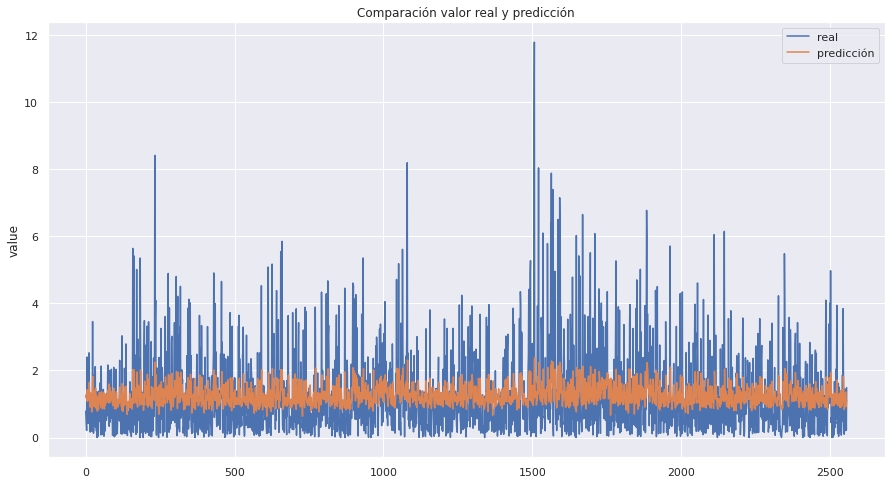

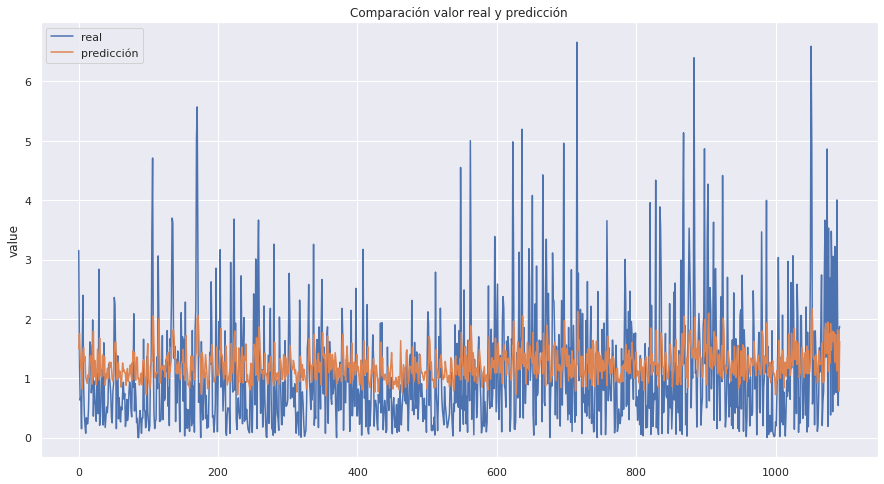

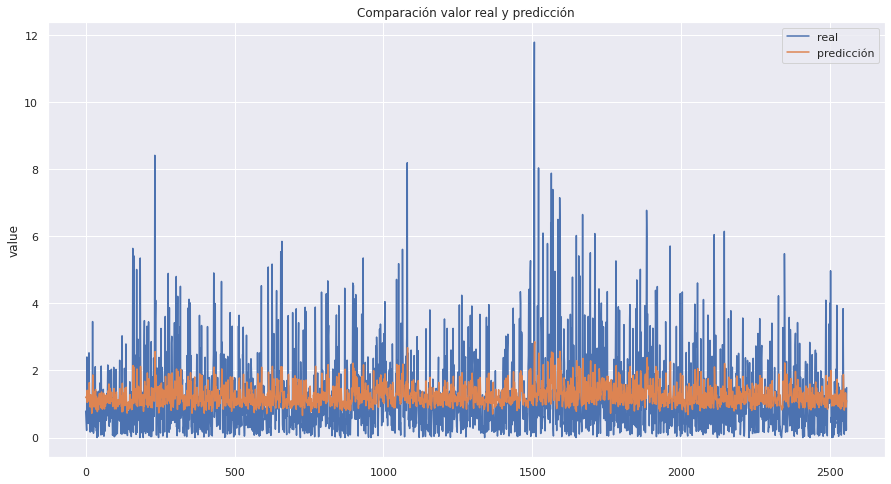

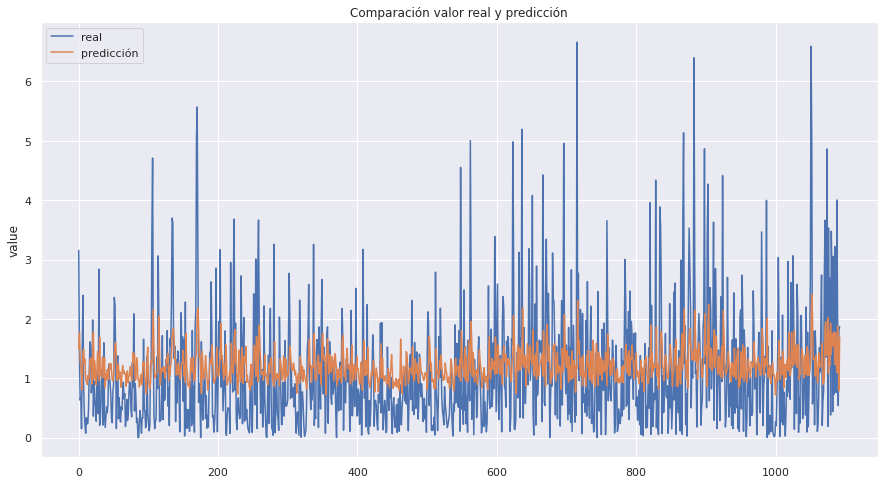

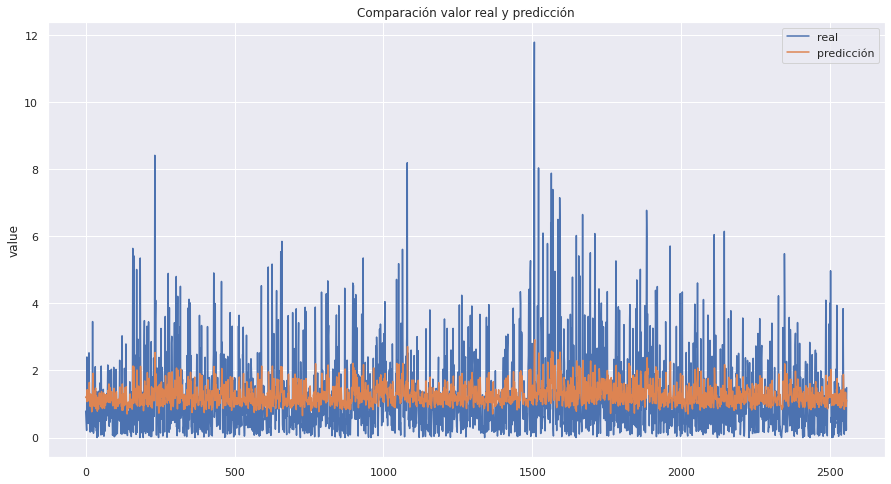

...

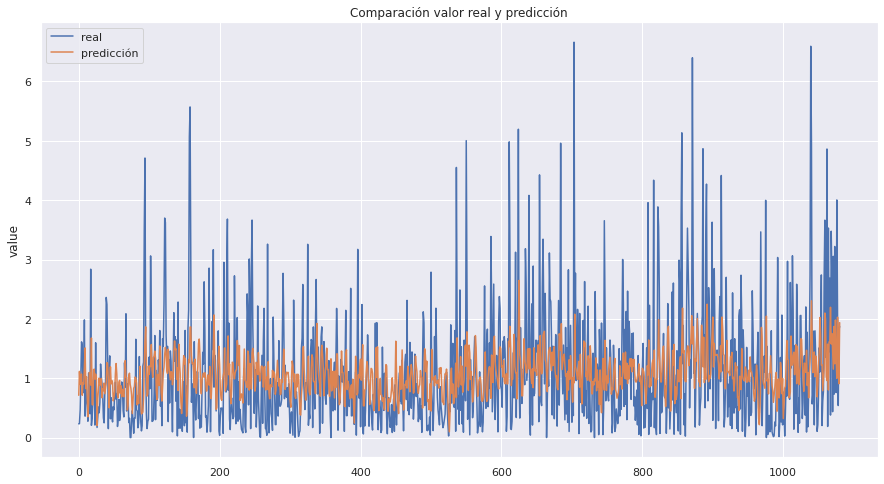

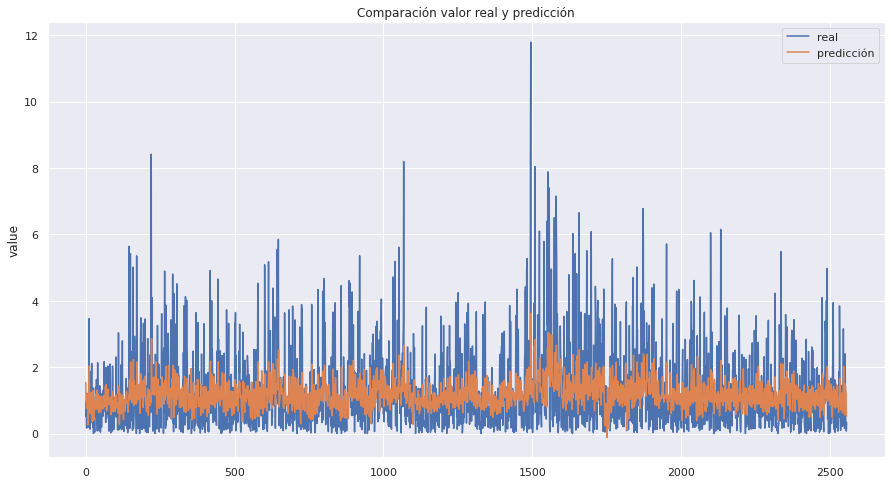

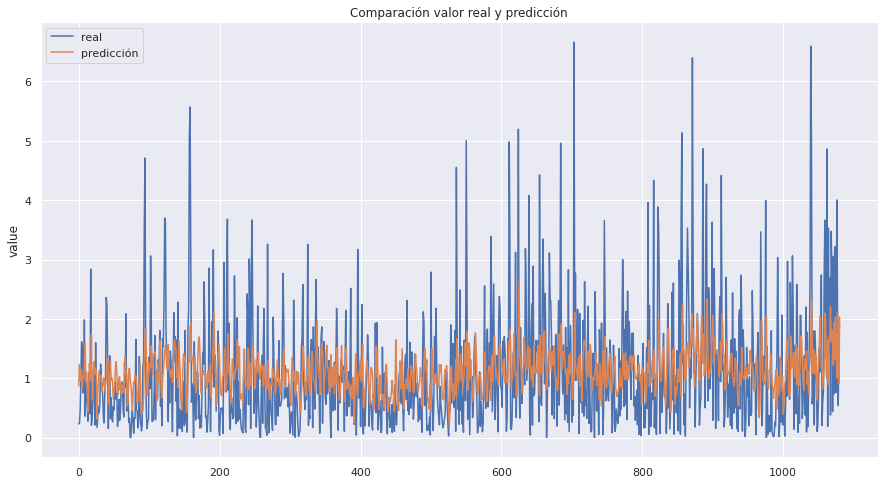

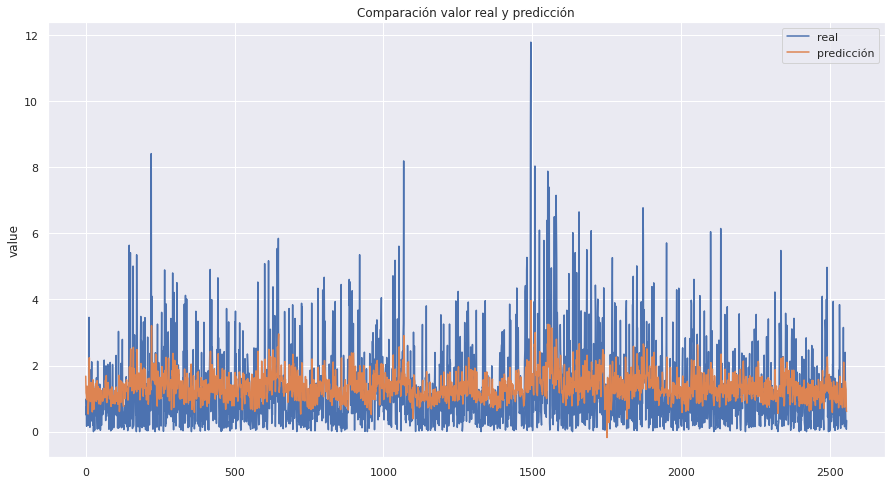

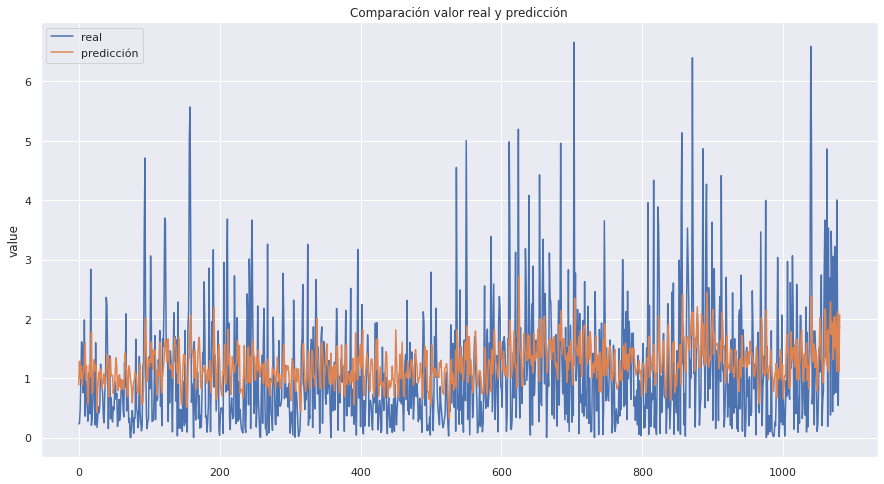

In [11]:
lags=[3,5,7,8,10,15]
n_estimators=[i for i in range(10,100,10)]
n_estimators.extend([200,300,500,2000])
results_models={i:{} for i in lags}
for lg in lags:
    for est in n_estimators:
        results_models[lg][est]=Model(df_data.copy(),df_label.copy(),lg,est)